In [42]:
import os
import tesserocr
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

In [49]:
ocr_data_path = 'data/ocr_data/'
input_path = 'data/to_process/'

print(tesserocr.tesseract_version())  # print tesseract-ocr version
print(tesserocr.get_languages(ocr_data_path))  # prints tessdata path and list of available languages

tesseract 4.1.1
 leptonica-1.81.1 (Feb 10 2022, 20:22:49) [MSC v.1930 LIB Release x64]
  libgif 5.2.1 : libjpeg 6b (libjpeg-turbo 2.0.6) : libpng 1.6.37 : libtiff 4.3.0 : zlib 1.2.11 : libwebp 1.2.1
('data/ocr_data/', ['chi_sim', 'chi_sim_vert', 'eng'])


In [11]:
input_images_name = sorted(os.listdir(input_path))
print(input_images_name)

['IMG_0834.JPG', 'IMG_0835.JPG', 'IMG_0836.JPG', 'IMG_0837.JPG', 'IMG_0838.JPG', 'IMG_0839.JPG', 'IMG_0840.JPG', 'IMG_0841.JPG', 'IMG_0842.JPG', 'IMG_0843.JPG', 'IMG_0844.JPG', 'IMG_0845.JPG', 'IMG_0846.JPG', 'IMG_0847.JPG', 'IMG_0848.JPG', 'IMG_0849.JPG', 'IMG_0850.JPG', 'IMG_0851.JPG', 'IMG_0852.JPG', 'IMG_0853.JPG', 'IMG_0854.JPG', 'IMG_0855.JPG', 'IMG_0856.JPG', 'IMG_0857.JPG', 'IMG_0858.JPG', 'IMG_0859.JPG', 'IMG_0860.JPG', 'IMG_0861.JPG', 'IMG_0862.JPG', 'IMG_0863.JPG', 'IMG_0864.JPG', 'IMG_0865.JPG', 'IMG_0866.JPG', 'IMG_0867.JPG', 'IMG_0868.JPG']


In [9]:
with tesserocr.PyTessBaseAPI(psm=tesserocr.PSM.AUTO_OSD) as api:
    for img_name in input_images_name[:1]:
        api.SetImageFile(input_path + img_name)
        api.Recognize()
        it = api.AnalyseLayout()
        orientation, direction, order, deskew_angle = it.Orientation()
        print("Orientation: {:d}".format(orientation))
        print("WritingDirection: {:d}".format(direction))
        print("TextlineOrder: {:d}".format(order))
        print("Deskew angle: {:.4f}".format(deskew_angle))

Orientation: 0
WritingDirection: 0
TextlineOrder: 2
Deskew angle: -0.0092


In [44]:
# Draw bounding boxes and text
def draw_image(image, bounds, color='red', width=2):
    myFont = ImageFont.truetype('data/font/msyh.ttc', 32)
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0 = [bound['x'], bound['y']]
        p1 = [bound['x']+bound['w'], bound['y']]
        p2 = [bound['x']+bound['w'], bound['y']+bound['h']]
        p3 = [bound['x'], bound['y']+bound['h']]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
        draw.text(p3, bound['text'], font=myFont, fill=(255, 0, 0))
    return image

Found 44 textline image components.


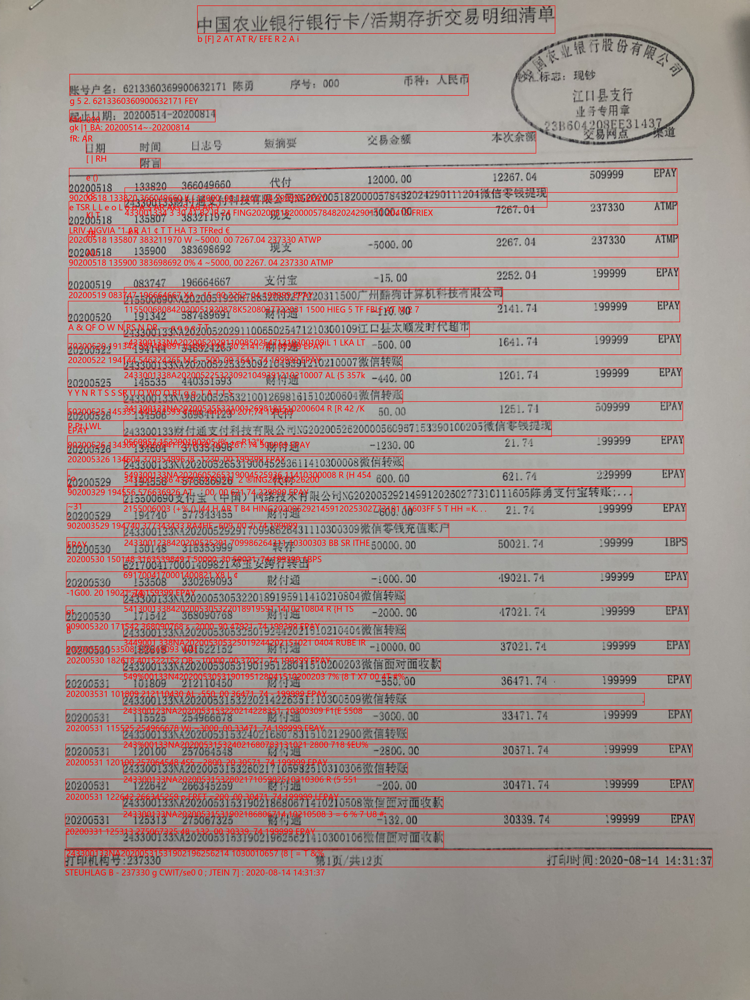

In [53]:
with tesserocr.PyTessBaseAPI(path=ocr_data_path) as api:
    for img_name in input_images_name[:1]:
        image = Image.open(input_path + img_name)
        image = image.rotate(270, expand=True) # uncomment this line if necessary
        api.SetImage(image)
        boxes = api.GetComponentImages(tesserocr.RIL.TEXTLINE, True)
        print('Found {} textline image components.'.format(len(boxes)))
        result = []
        for i, (im, box, _, _) in enumerate(boxes):
            # im is a PIL image object
            # box is a dict with x, y, w and h keys
            api.SetRectangle(box['x'], box['y'], box['w'], box['h'])
            text = api.GetUTF8Text()
            box['text'] = text
            result.append(box)
        display(draw_image(image, result))